Accession: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE90063

The following data was downloaded from the [Single Cell Portal](https://singlecell.broadinstitute.org/single_cell):

- https://singlecell.broadinstitute.org/single_cell/study/SCP31/perturb-seq-k562#
- https://singlecell.broadinstitute.org/single_cell/study/SCP24/perturb-seq

In [1]:
# %load block0_load.py
author_year = 'Dixit_2016'
is_counts = True
var_genes = 'gene_symbols'
doi = '10.1016/j.cell.2016.11.038'

import numpy as np
import pandas as pd
import scanpy as sc
sc.set_figure_params(dpi=100, frameon=False)
sc.logging.print_header()

# verify
assert(doi in pd.read_csv('../personal.csv').DOI.values)

adata = sc.read(f'{author_year}_raw.h5ad')
adata

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-02-07 23:48:35.288278: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-02-07 23:48:35.288324: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


AnnData object with n_obs × n_vars = 104179 × 25111
    obs: 'cluster', 'guide', 'INTERGENIC1144056', 'INTERGENIC1216445', 'INTERGENIC216151', 'INTERGENIC393453', 'sgCREB1_2', 'sgCREB1_4', 'sgCREB1_5', 'sgE2F4_6', 'sgE2F4_7', 'sgEGR1_2', 'sgEGR1_3', 'sgEGR1_4', 'sgELF1_1', 'sgELF1_2', 'sgELF1_4', 'sgELF1_5', 'sgELK1_1', 'sgELK1_6', 'sgELK1_7', 'sgETS1_3', 'sgETS1_5', 'sgGABPA_1', 'sgGABPA_9', 'sgIRF1_2', 'sgIRF1_3', 'sgNR2C2_2', 'sgNR2C2_3', 'sgNR2C2_5', 'sgYY1_10', 'sgYY1_3', 'batch'
    var: 'gene_symbols'

,count,unique,top,freq
cluster,104179,3,tfs_highmoi,51898
guide,104179,1729,,9843
INTERGENIC1144056,104179,2,False,99182
INTERGENIC1216445,104179,2,False,100257
INTERGENIC216151,104179,2,False,99210
INTERGENIC393453,104179,2,False,94738
sgCREB1_2,104179,2,False,100701
sgCREB1_4,104179,2,False,100578
sgCREB1_5,104179,2,False,100457
sgE2F4_6,104179,2,False,101021


Index(['TSPAN6', 'TNMD', 'DPM1', 'SCYL3', 'C1orf112', 'FGR', 'CFH', 'FUCA2',
       'GCLC', 'NFYA',
       ...
       'RP11-108L7.14', 'RP11-196O16.1', 'RP11-465N4.5', 'RP11-126K1.9',
       'RP4-671G15.2', 'RP11-225H22.7', 'RP11-731C17.2', 'RP11-114I8.4',
       'RP11-180C16.1', 'RP11-80H18.4'],
      dtype='object', name='gene_symbols', length=25111)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


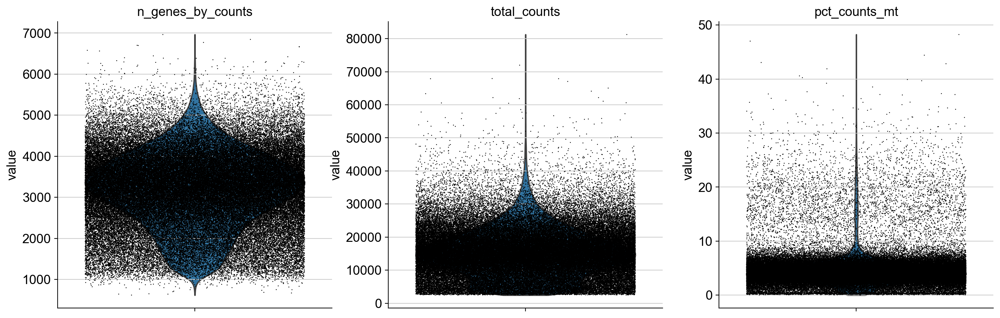

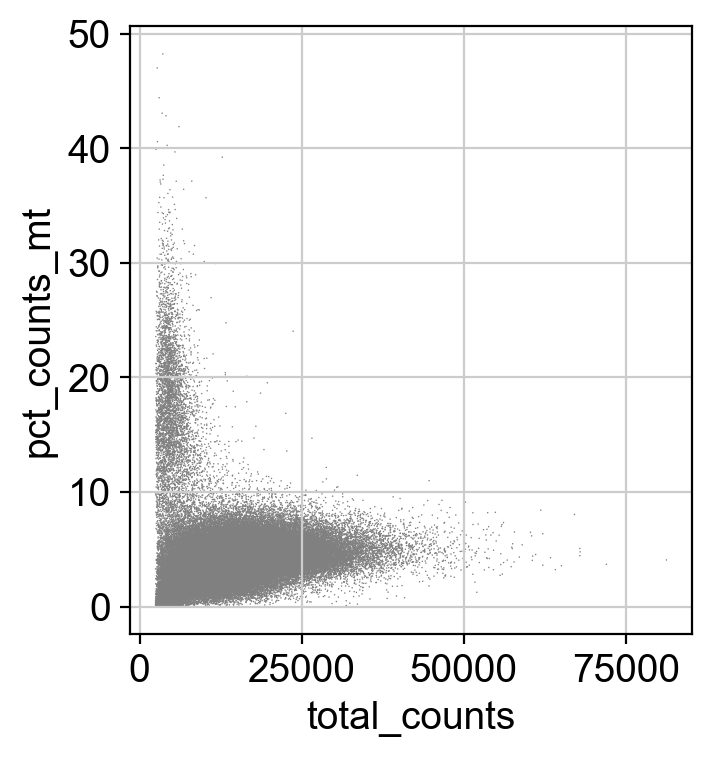

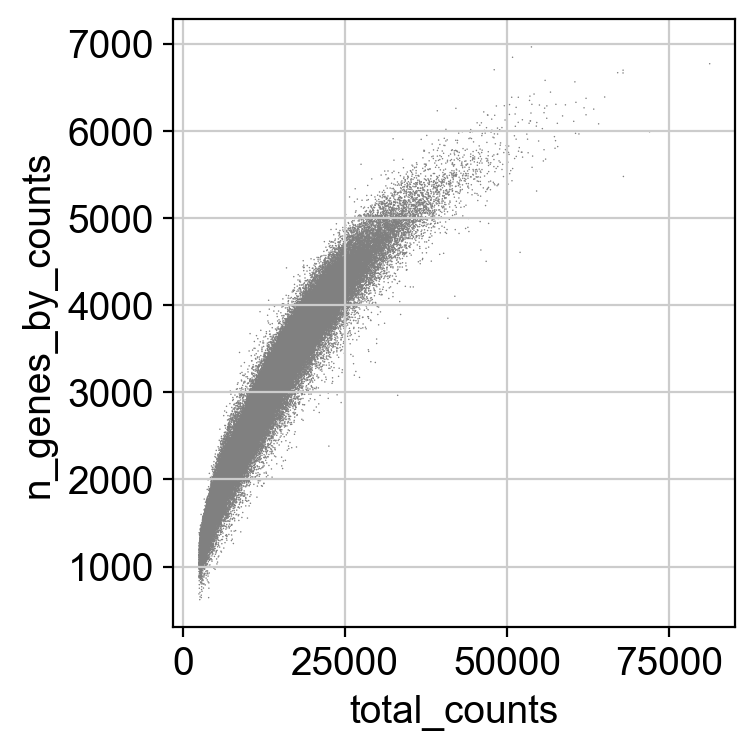

In [2]:
# %load block1_init.py
# metalabels
adata.uns['preprocessing_nb_link'] = f'https://nbviewer.org/github/theislab/sc-pert/blob/main/datasets/{author_year}_curation.ipynb'
adata.uns['doi'] = doi
display(adata.obs.describe(include='all').T.head(20))

# use gene symbols as gene names
if var_genes:
    adata.var[var_genes] = adata.var[var_genes].astype(str)
    adata.var = adata.var.reset_index().set_index(var_genes)
    print(adata.var_names)

# filtering and processing
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=20)
adata.var_names_make_unique()

adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [3]:
adata = adata[adata.obs.n_genes_by_counts < 6000, :]  # edit
adata = adata[adata.obs.pct_counts_mt < 10]

Add additional labels, normalize and add plotting variables.

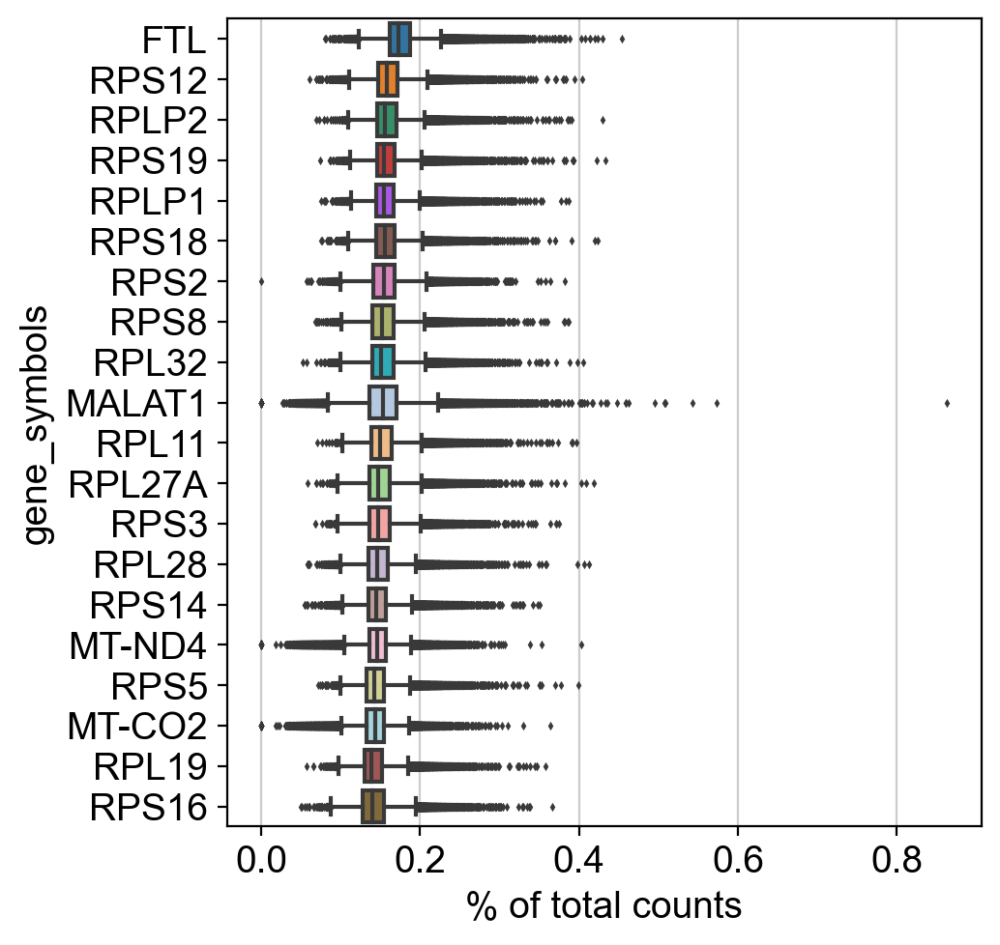

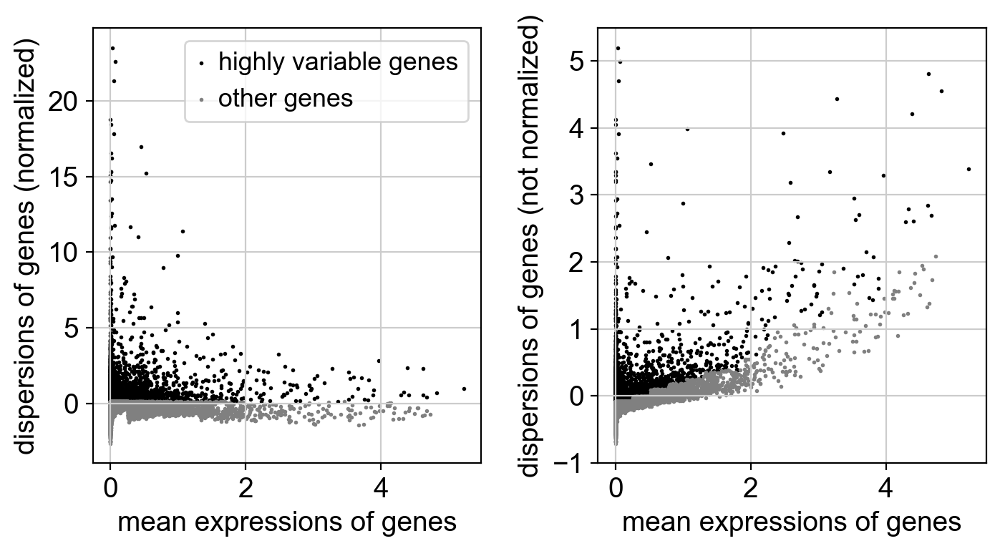

In [4]:
# %load block2_process.py
if is_counts:
    adata.layers['counts'] = adata.X
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

sc.pl.highest_expr_genes(adata, n_top=20)
sc.pp.highly_variable_genes(adata, n_top_genes=5000, subset=False)
sc.pl.highly_variable_genes(adata)

# pre-compute plots
sc.tl.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

Save.

In [5]:
sc.write(f'{author_year}.h5ad', adata, compression='gzip')
adata

AnnData object with n_obs × n_vars = 99722 × 18531
    obs: 'cluster', 'guide', 'INTERGENIC1144056', 'INTERGENIC1216445', 'INTERGENIC216151', 'INTERGENIC393453', 'sgCREB1_2', 'sgCREB1_4', 'sgCREB1_5', 'sgE2F4_6', 'sgE2F4_7', 'sgEGR1_2', 'sgEGR1_3', 'sgEGR1_4', 'sgELF1_1', 'sgELF1_2', 'sgELF1_4', 'sgELF1_5', 'sgELK1_1', 'sgELK1_6', 'sgELK1_7', 'sgETS1_3', 'sgETS1_5', 'sgGABPA_1', 'sgGABPA_9', 'sgIRF1_2', 'sgIRF1_3', 'sgNR2C2_2', 'sgNR2C2_3', 'sgNR2C2_5', 'sgYY1_10', 'sgYY1_3', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'index', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'preprocessing_nb_link', 'doi', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

Standardized perturbation labels and save again. Here, we replace the different guide versions with the same label.

In [56]:
# %load block3_standardize.py
import re
adata.obs['perturbation_name'] = [re.sub('_[0-9]', '', '+'.join(re.split('\\+', s))) if s != '' else 'control' for s in adata.obs['guide'].values]
adata.obs['perturbation_name'] = adata.obs['perturbation_name'].astype('category')

adata.obs['perturbation_type'] = 'genetic'
adata.obs['perturbation_value'] = np.nan
adata.obs['perturbation_unit'] = np.nan

In [58]:
sc.write(f'{author_year}.h5ad', adata, compression='gzip')
adata

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'perturbation_type' as categorical


AnnData object with n_obs × n_vars = 99722 × 18531
    obs: 'cluster', 'guide', 'INTERGENIC1144056', 'INTERGENIC1216445', 'INTERGENIC216151', 'INTERGENIC393453', 'sgCREB1_2', 'sgCREB1_4', 'sgCREB1_5', 'sgE2F4_6', 'sgE2F4_7', 'sgEGR1_2', 'sgEGR1_3', 'sgEGR1_4', 'sgELF1_1', 'sgELF1_2', 'sgELF1_4', 'sgELF1_5', 'sgELK1_1', 'sgELK1_6', 'sgELK1_7', 'sgETS1_3', 'sgETS1_5', 'sgGABPA_1', 'sgGABPA_9', 'sgIRF1_2', 'sgIRF1_3', 'sgNR2C2_2', 'sgNR2C2_3', 'sgNR2C2_5', 'sgYY1_10', 'sgYY1_3', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'perturbation_name', 'perturbation_type', 'perturbation_value', 'perturbation_unit'
    var: 'index', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'preprocessing_nb_link', 'doi', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

View.

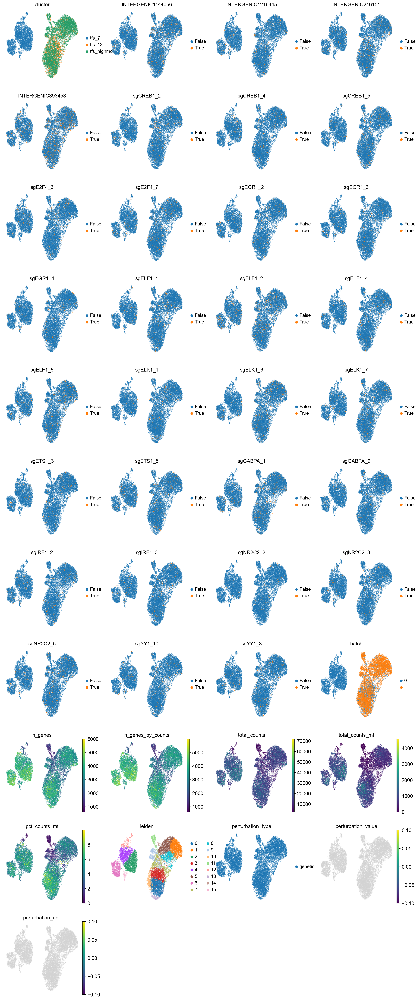

In [59]:
plot_cols = [c for c in adata.obs.columns if len(adata.obs[c].unique()) < 30 or not hasattr(adata.obs[c], 'cat')]
for c in plot_cols:
    if adata.obs[c].dtype == 'bool':
        adata.obs[c] = adata.obs[c].astype('category')
sc.pl.umap(adata, color=plot_cols)